In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import sys
sys.path.append('/Users/dodkins/PythonProjects/stocks/options_testing/options_testing')
from datetime import datetime 
import pandas as pd
from robinhood import get_options_plays
from yahoo import get_tsla 
from plots import plot_candles, plot_timeseries, plot_line
import opstrat as op

In [2]:
data_dir = '/Users/dodkins/PythonProjects/stocks/options_testing/data/'

In [3]:
tsla = pd.DataFrame(columns=['date', 'open','close'])
for col, dtype in zip(['date', 'open','close'], [str, float, float]):
    tsla_col_loc = os.path.join(data_dir, f'tsla_minutely_{col}.txt')
    tsla[col] = np.loadtxt(tsla_col_loc, delimiter=',', dtype=dtype)

In [4]:
tsla

,date,open,close
0,2022-04-22 14:01:00,334.219967,334.333300
1,2022-04-22 14:02:00,334.413300,334.529967
2,2022-04-22 14:03:00,334.503300,334.283300
3,2022-04-22 14:04:00,334.253300,334.799967
4,2022-04-22 14:05:00,334.799967,335.056633
...,...,...,...
35995,2022-09-02 15:56:00,270.390000,269.910000
35996,2022-09-02 15:57:00,269.900000,269.410000
35997,2022-09-02 15:58:00,269.410000,269.810000
35998,2022-09-02 15:59:00,269.820000,269.800000


In [5]:
tsla = tsla.set_index('date')

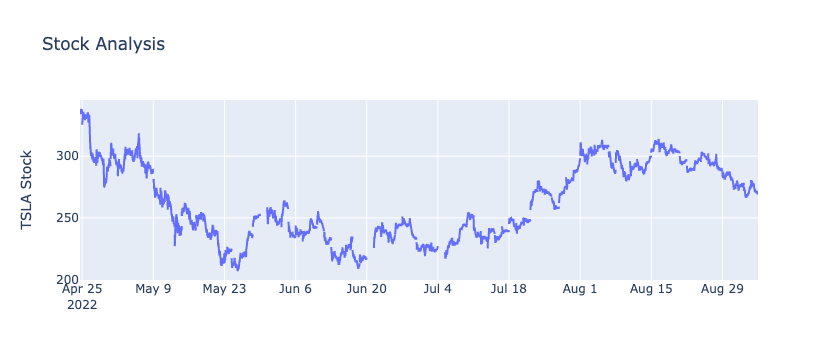

In [6]:
plot_timeseries(tsla)

In [7]:
tsla

,open,close
date,,
2022-04-22 14:01:00,334.219967,334.333300
2022-04-22 14:02:00,334.413300,334.529967
2022-04-22 14:03:00,334.503300,334.283300
2022-04-22 14:04:00,334.253300,334.799967
2022-04-22 14:05:00,334.799967,335.056633
...,...,...
2022-09-02 15:56:00,270.390000,269.910000
2022-09-02 15:57:00,269.900000,269.410000
2022-09-02 15:58:00,269.410000,269.810000


In [8]:
from options import get_option_history

In [9]:
tsla.columns

Index(['open', 'close'], dtype='object')

In [69]:
spot_price = tsla.iloc[0]['close']
spot_date = datetime.strptime(tsla.index[0], "%Y-%m-%d %H:%M:%S")

In [71]:
expiration = datetime.strptime('2022-9-30', "%Y-%m-%d")

In [70]:
spot_price, spot_date

(334.3332999, datetime.datetime(2022, 4, 22, 14, 1))

160

In [12]:
#long_call

spot_price = tsla.iloc[0]['close']
spot_date = datetime.strptime(tsla.index[0], "%Y-%m-%d %H:%M:%S")
expiration = datetime.strptime('2022-9-30', "%Y-%m-%d")
DTE = (expiration-spot_date).days
bsm=op.black_scholes(K=285, St=spot_price, r=2.8, t=DTE,
                     v=53, type='c')
bsm

{'value': {'option value': 74.2719359625984,
  'intrinsic value': 49.333299899999986,
  'time value': 24.93863606259842},
 'greeks': {'delta': 0.7471010144108368,
  'gamma': 0.002725203836622827,
  'theta': -0.13067975537864004,
  'vega': 0.7077196421189347,
  'rho': 0.7693536944395138}}

In [22]:
option_history = get_option_history(tsla_hourly, strike=285, expiration='9/30/2022', risk_free=3)

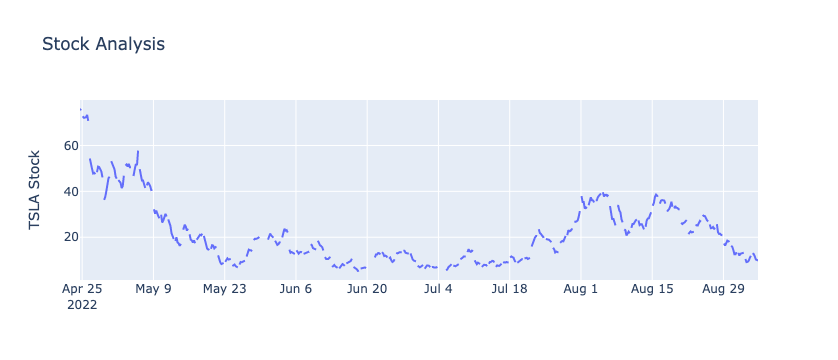

In [23]:
plot_line(option_history)

In [27]:
tsla.index = pd.to_datetime(tsla.index)

In [28]:
option_history = get_option_history(tsla, strike=285, expiration='9/30/2022', risk_free=3)

In [29]:
len(option_history)

36000

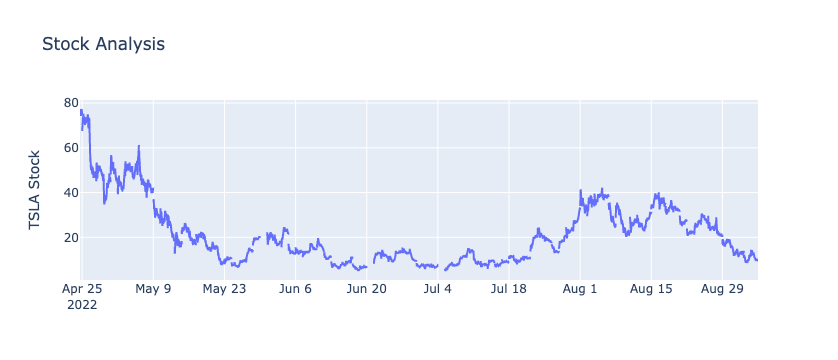

In [30]:
plot_line(option_history)

In [31]:
leap_hourly = get_option_history(tsla_hourly, strike=285, expiration='9/30/2022', risk_free=3)

In [34]:
short_call = tsla_hourly['close']*1.05

In [177]:
leap_hourly = get_option_history(downsample(tsla, freq='hourly'), strike=285, expiration='9/30/2022', risk_free=3)

In [158]:
def downsample(df_minutely, freq='hourly'):
    dt_args = ['year', 'month', 'day', 'hour', 'minute']
    dt_starts = {dta:s for dta, s in zip(dt_args, [1970, 1, 1, 9, 30])}

    times = pd.to_datetime(df_minutely.index)
    if freq == 'hourly':
        groups = ['year', 'month', 'day', 'hour']
    elif freq == 'daily':
        groups = ['year', 'month', 'day']
    elif freq == 'weekly':
        groups = ['year', 'week']
    elif freq == 'monthly':
        groups = ['year', 'month']
    else:
        raise ValueError(f"frequency '{freq}' not recognised")

    grouped = df_minutely.groupby([getattr(times, g) for g in groups])
    close = grouped.close.last()
    df_subsamp = pd.DataFrame(index=range(len(close)), columns=['open', 'high', 'low', 'close'])
    df_subsamp['open'] = np.array(grouped.open.first())
    df_subsamp['high'] = np.array(grouped.open.max())
    df_subsamp['low'] = np.array(grouped.open.min())
    df_subsamp['close'] = np.array(close)

    indices = np.empty(len(close), dtype=datetime)
    for r, dt_tup in enumerate(zip(*[close.index.get_level_values(i) for i in range(len(groups))])):
        kwargs = {k: dt_tup[groups.index(k)] if k in groups else dt_starts[k] for k in dt_args}
        
        if 'week' in groups:
            weeks=dt_tup[groups.index('week')] 
        else:
            weeks=0
        week_offset = relativedelta(weeks=weeks)
        date = datetime(**kwargs)+ week_offset

        indices[r] = date
    df_subsamp.index = indices
    return df_subsamp
downsample(df_minutely, 'monthly')

,open,high,low,close
2022-04-01 09:30:00,334.219967,338.186633,274.554973,290.253304
2022-05-01 09:30:00,287.209971,318.359968,206.996646,252.753308
2022-06-01 09:30:00,251.719975,264.166640,208.793312,224.473311
2022-07-01 09:30:00,227.253311,298.279970,216.829978,297.149970
2022-08-01 09:30:00,301.333303,313.999969,272.130000,275.610000
2022-09-01 09:30:00,272.590000,281.470000,266.320000,270.210000


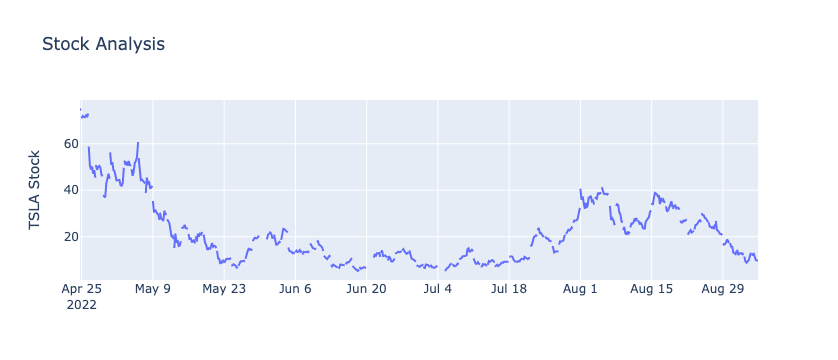

In [181]:
plot_line(leap_hourly)

In [189]:
short_call = downsample(tsla, freq='weekly')

In [226]:
short_call['strike'] = short_call['open']*1.05

In [192]:
short_call.iloc[0]

open      334.219967
high      338.186633
low       334.093300
close     335.016633
strike    351.767465
Name: 2022-04-23 09:30:00, dtype: float64

In [198]:
bsm_open = op.black_scholes(K=short_call.iloc[0]['strike'], St=tsla_weekly.iloc[0]['open'], 
                       r=3, t=5, v=53, type='c')
bsm_close = op.black_scholes(K=short_call.iloc[0]['strike'], St=tsla_weekly.iloc[0]['close'], 
                       r=3, t=0, v=53, type='c')
bsm_open['value']['option value'] - bsm_close['value']['option value']

2.4741469104848903

In [227]:
short_call['call_open'] = np.nan
short_call['call_close'] = np.nan
short_call['profit'] = np.nan

In [228]:
short_call

,open,high,low,close,strike,call_open,call_close,profit,date
0,334.219967,338.186633,334.093300,335.016633,350.930965,NaN,NaN,NaN,2022-04-23 09:30:00
1,326.463301,335.811633,274.554973,290.253304,342.786466,NaN,NaN,NaN,2022-04-30 09:30:00
2,287.209971,318.359968,281.923305,288.549971,301.570470,NaN,NaN,NaN,2022-05-07 09:30:00
3,278.803305,281.443305,227.069977,256.529974,292.743471,NaN,NaN,NaN,2022-05-14 09:30:00
4,255.999974,255.999974,211.066646,221.299978,268.799973,NaN,NaN,NaN,2022-05-21 09:30:00
5,218.333312,253.163308,206.996646,253.209975,229.249977,NaN,NaN,NaN,2022-05-28 09:30:00
6,257.869974,264.166640,233.521643,234.516643,270.763473,NaN,NaN,NaN,2022-06-04 09:30:00
7,244.666642,255.436641,228.189977,232.229977,256.899974,NaN,NaN,NaN,2022-06-11 09:30:00
8,222.999978,234.806643,208.793312,216.759978,234.149977,NaN,NaN,NaN,2022-06-18 09:30:00
9,224.459978,246.423309,224.459978,245.706642,235.682976,NaN,NaN,NaN,2022-06-25 09:30:00


In [212]:
short_call['date'] = short_call.index
# short_call.reset_index(drop=True)

In [215]:
short_call=short_call.reset_index(drop=True)

In [238]:
for iw, (date, week) in enumerate(short_call.iterrows()):
    bsm_open = op.black_scholes(K=week['strike'], St=week['open'], r=3, t=5, v=53, type='c')
    bsm_close = op.black_scholes(K=week['strike'], St=week['close'], r=3, t=0, v=53, type='c')
    print(bsm_open['value']['option value'], bsm_close['value']['option value'])
    short_call.at[iw, 'call_open'] = bsm_open['value']['option value']
    short_call.at[iw, 'call_close'] = bsm_close['value']['option value']
short_call['profit'] = short_call['call_open'] - short_call['call_close']

2.6440947270535133 0.0
2.58272987326599 0.0
2.2721873213961956 0.0
2.205680161425434 0.0
2.0252775121946485 0.0
1.72728746157226 23.959997603999994
2.0400715315220097 0.0
1.9356167889985372 0.0
1.7642065828883133 0.0
1.7757569937000497 10.023665664299983
1.972825989124928 0.0
1.7619123232065306 16.91783164154998
1.9924722358252183 0.0
1.9382538690925415 14.993331834000003
2.1534923463650983 11.332998866699995
2.3839204049791363 0.0
2.332497343146045 0.0
2.3874013507032004 0.0
2.311163365185571 0.0
2.238881223697014 0.0


In [239]:
short_call

,open,high,low,close,strike,call_open,call_close,profit,date
0,334.219967,338.186633,334.093300,335.016633,350.930965,2.644095,0.000000,2.644095,2022-04-23 09:30:00
1,326.463301,335.811633,274.554973,290.253304,342.786466,2.582730,0.000000,2.582730,2022-04-30 09:30:00
2,287.209971,318.359968,281.923305,288.549971,301.570470,2.272187,0.000000,2.272187,2022-05-07 09:30:00
3,278.803305,281.443305,227.069977,256.529974,292.743471,2.205680,0.000000,2.205680,2022-05-14 09:30:00
4,255.999974,255.999974,211.066646,221.299978,268.799973,2.025278,0.000000,2.025278,2022-05-21 09:30:00
5,218.333312,253.163308,206.996646,253.209975,229.249977,1.727287,23.959998,-22.232710,2022-05-28 09:30:00
6,257.869974,264.166640,233.521643,234.516643,270.763473,2.040072,0.000000,2.040072,2022-06-04 09:30:00
7,244.666642,255.436641,228.189977,232.229977,256.899974,1.935617,0.000000,1.935617,2022-06-11 09:30:00
8,222.999978,234.806643,208.793312,216.759978,234.149977,1.764207,0.000000,1.764207,2022-06-18 09:30:00
9,224.459978,246.423309,224.459978,245.706642,235.682976,1.775757,10.023666,-8.247909,2022-06-25 09:30:00


In [240]:
short_call['profit'].array.sum()

-34.78209620520772

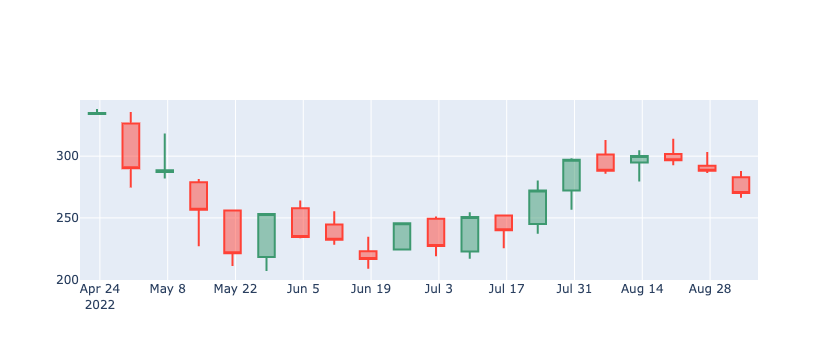

In [221]:
plot_candles(short_call, show_afterhours=True)

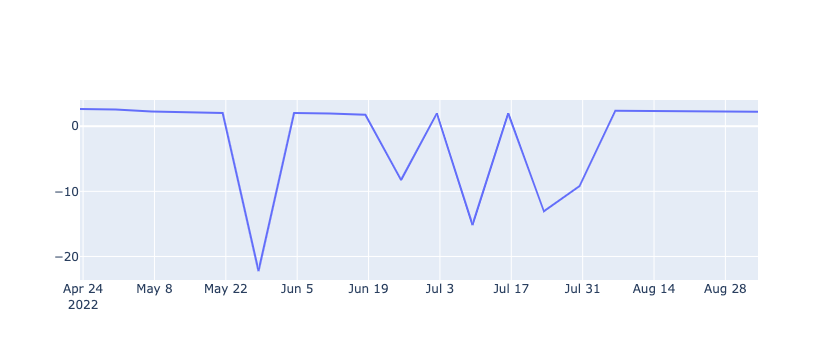

In [243]:
plot_line(short_call, value='profit', show_afterhours=True)

In [244]:
short_call['running profit'] = short_call['profit'].cumsum()

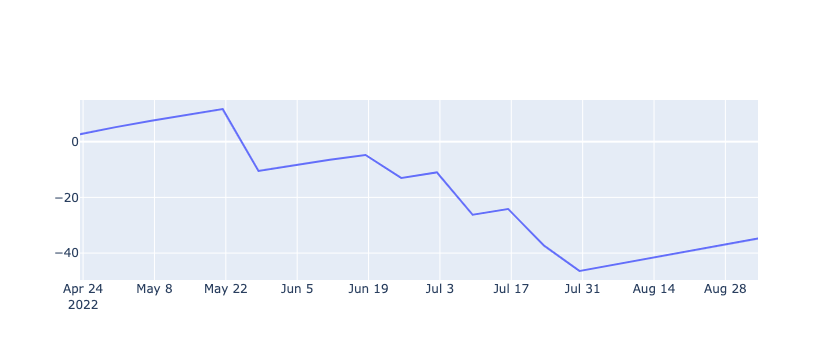

In [245]:
plot_line(short_call, value='running profit', show_afterhours=True)